In [2]:
import numpy as np
import pandas as pd

import nltk
import spacy
import re
nltk.download('stopwords')
from spacy.lang.en import stop_words
from spacy.lang.en.stop_words import STOP_WORDS      


import tensorflow
import sklearn

import seaborn as sns
import plotly.express as px
from wordcloud import wordcloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline

pd.options.plotting.backend = 'plotly'
pd.set_option(max_colwidth = 150)
from warnings import filterwarnings
filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\modza\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# 
* Importing Data
* Undersatnding Data

  
# EDA
* Text length Analysis
* Sentient Distribution --using Pie-Chart
* Most Frequent word visualization
  
## Data Pre-Processing
Defining function which will take care all of the following:-

* converting to lowercase
* removing Non-letters
* tokenization
* removing stopwords
* Stemming



In [3]:
df= pd.read_csv('Twitter_Data.csv')
df.head()


,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [4]:
df.isnull().sum()

clean_text    4
category      7
dtype: int64

In [5]:
df.dropna(inplace = True)

In [6]:
df['sentiment'] = df['category'].map({-1.0:'Negative',0.0:'Neutral',1:'Positive'})

df.head()

,clean_text,category,sentiment
0,when modi promised “minimum government maximum...,-1.0,Negative
1,talk all the nonsense and continue all the dra...,0.0,Neutral
2,what did just say vote for modi welcome bjp t...,1.0,Positive
3,asking his supporters prefix chowkidar their n...,1.0,Positive
4,answer who among these the most powerful world...,1.0,Positive


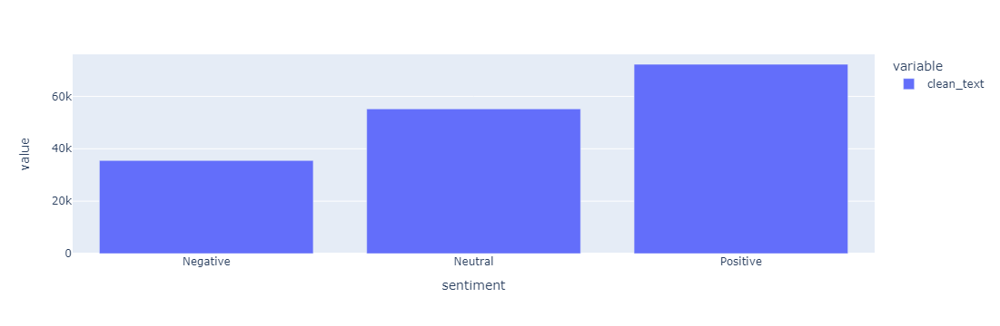

In [8]:
df[['clean_text','sentiment']].groupby('sentiment').count().plot(kind = 'bar')

# Tweet length

In [9]:
pd.Series([len(tweet.split()) for tweet in df['clean_text']])

0         33
1         13
2         22
3         34
4         14
          ..
162964    18
162965    36
162966     9
162967    13
162968    34
Length: 162969, dtype: int64

In [17]:
pd.set_option('max_colwidth',200)

for tweet in df['clean_text'][:100]:
    print(len(tweet.split()),' ')
    print(tweet)
print()          

df['clean_text']

## Text-length Analysis

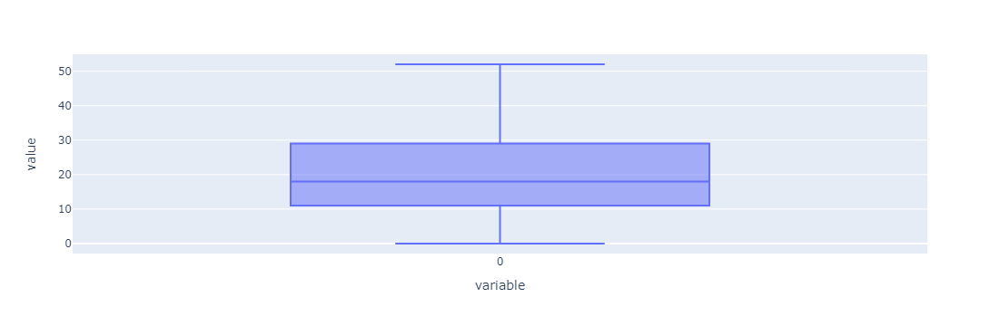

In [50]:
##Calculate tweet lengths
tweet_len = pd.Series([len(tweet.split()) for tweet in df['clean_text']])

# The distribution of tweet text lengths
tweet_len.plot(kind='box')

In [26]:
df.clean_text.str.split().apply(len)

0         33
1         13
2         22
3         34
4         14
          ..
162975    18
162976    36
162977     9
162978    13
162979    34
Name: clean_text, Length: 162969, dtype: int64

In [29]:
df.length[df.sentiment=='Positive'].describe().to_frame().round(2)

,length
count,72249.00
mean,22.65
std,10.60
min,1.00
25%,14.00
50%,22.00
75%,32.00
max,50.00


In [42]:
describe = df.length[df.sentiment=='Positive'].describe().to_frame().round(2)

fig, axs = plt.figure(figsize=(14,7))


axs.axis('off')
font_size = 14
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=[0,0,1,1], colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

In [1]:
import pandas as pd

In [2]:
df = pd.read_xml('mcc_al.xml')
df.head()

,default-currency,lang,last-updated-datetime,hierarchy,iati-identifier,reporting-org,title,description,participating-org,activity-status,...,default-tied-status,related-activity,conditions,sector,country-budget-items,collaboration-type,budget,capital-spend,transaction,usg-activity
0,USD,en,2024-02-07T00:00:00-04:00,1,US-GOV-18-ALB-2750BXDILD,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USD,en,2024-02-07T00:00:00-04:00,2,US-GOV-18-ALB-2750BXDILD-MON & EVAL,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,USD,en,2024-02-07T00:00:00-04:00,3,US-GOV-18-ALB-2750BXDILD-MON & EVAL-0016,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USD,en,2024-02-07T00:00:00-04:00,3,US-GOV-18-ALB-2750BXDILD-MON & EVAL-NA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df.shape

(4, 27)

C:\Users\modza\Documents\nlp\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Text(0.5, 0.98, 'Distribution of text length for positive sentiment tweets.')

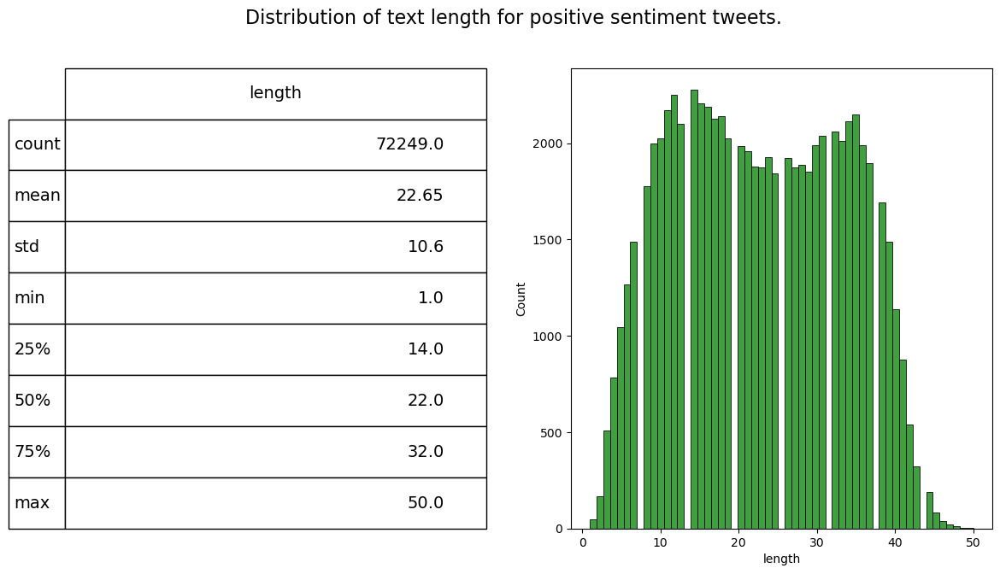

In [23]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.clean_text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['sentiment']=='Positive']['length'], ax=ax1,color='green')
describe = df.length[df.sentiment=='Positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = deascribe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

C:\Users\modza\Documents\nlp\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Text(0.5, 0.98, 'Distribution of text length for Negative sentiment tweets.')

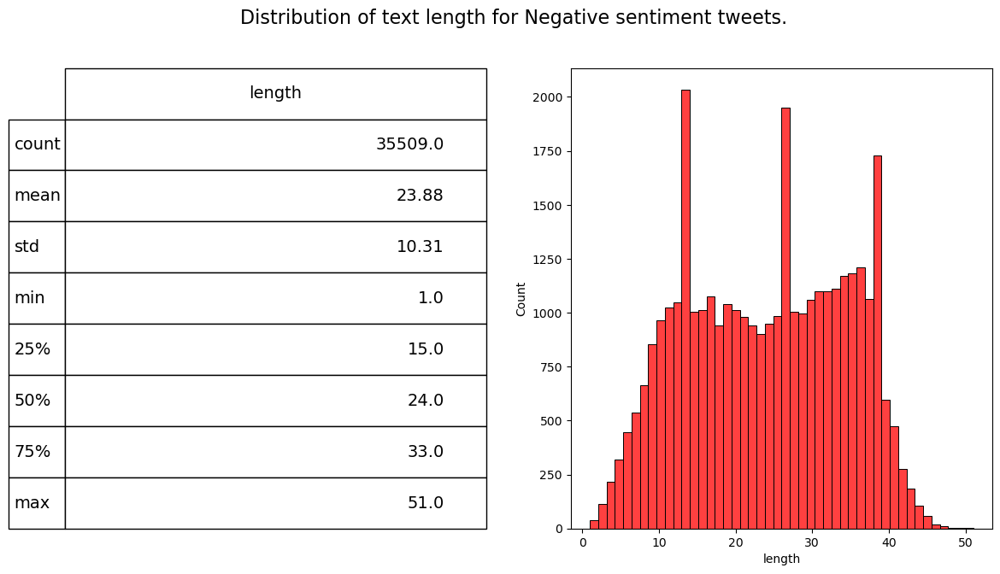

In [60]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.clean_text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['sentiment']=='Negative']['length'], ax=ax1,color='red')
describe = df.length[df.sentiment=='Negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for Negative sentiment tweets.', fontsize=16)

## Sentiment Distribution

import plotly.express as px
fig = px.pie(df[['clean_text','sentiment']], names='sentiment', title ='Pie chart of different sentiments of tweets')
fig.show()

## Visualizing most freqent word in Dataset

In [56]:
''.join([tweet for tweet in df[df.sentiment=='Positive']['clean_text']])

'what did just say vote for modi  welcome bjp told you rahul the main campaigner for modi think modi should just relaxasking his supporters prefix chowkidar their names modi did great service now there confusion what read what not now crustal clear what will crass filthy nonsensical see how most abuses are coming from chowkidarsanswer who among these the most powerful world leader today trump putin modi may with upcoming election india saga going important pair look current modi leads govt elected with deal brexit combination this weekly looks juicy bears imho gandhi was gay does modi  things like demonetisation gst goods and services tax…the upper castes would sort either view favourably say that need give this more time other castes like dalits the muslims were more against because that’ just not modi’ constituency2hope tuthukudi people would prefer honest well behaved nationalist courageous likly minister modi cabinet vote benifit thuthukudi calm waters wheres the modi wave dont pla

In [53]:
from wordcloud import wordcloud, STOPWORDS

In [ ]:
wordcloud.WordCloud()

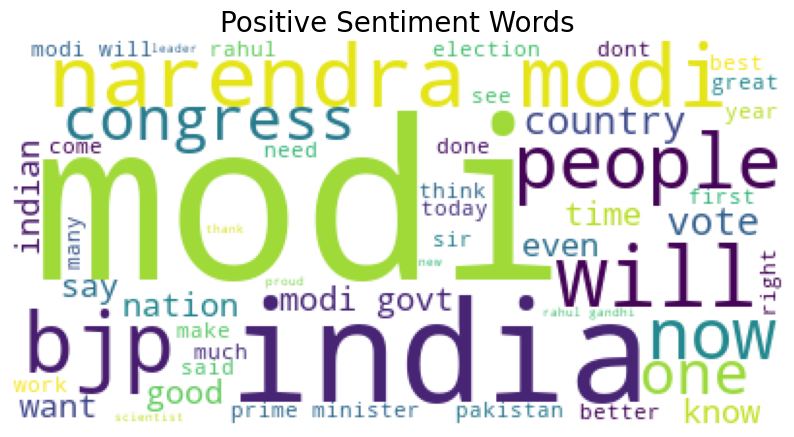

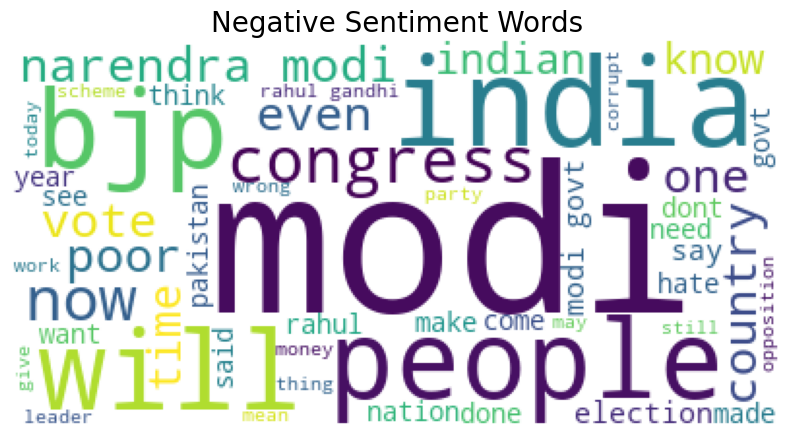

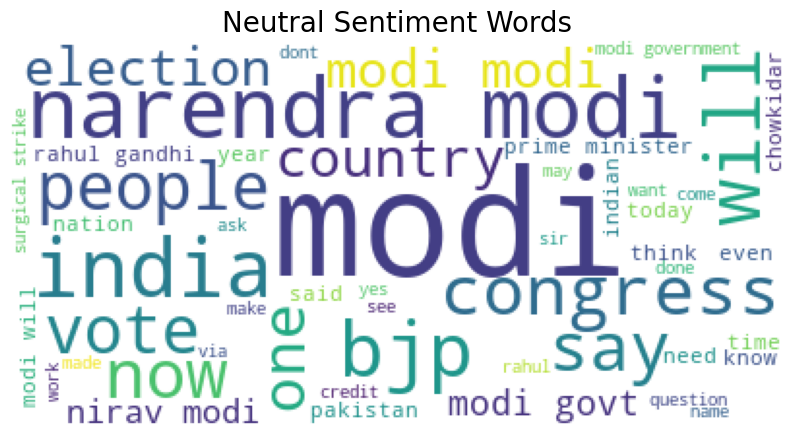

In [57]:
from wordcloud import WordCloud, STOPWORDS

def wordcount_gen(df, category):
    '''
    Generating Word Cloud
    inputs:
       - df: tweets dataset
       - category: Positive/Negative/Neutral
    '''
    # Combine all tweets
    combined_tweets = " ".join([tweet for tweet in df[df.sentiment==category]['clean_text']])
                          
    # Initialize wordcloud object
    wc = WordCloud(background_color='white', 
                   max_words=50, 
                   stopwords = STOPWORDS)
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(category), fontsize=20)
    plt.axis('off')
    plt.show()
    
# Positive tweet words
wordcount_gen(df, 'Positive')
     
# Negative tweet words
wordcount_gen(df, 'Negative')
     
# Neutral tweet words
wordcount_gen(df, 'Neutral')

In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [81]:
tonumeric = TfidfVectorizer(stop_words = 'english',ngram_range = (1,2),max_df = 0.80, min_df = 0.05)
tonumeric

TfidfVectorizer(max_df=0.8, min_df=0.05, ngram_range=(1, 2),
                stop_words='english')

In [82]:
df.head(2)

,clean_text,category,sentiment,length
0,when modi promised “minimum government maximum governance” expected him begin the difficult job reforming the state why does take years get justice state should and not business and should exit ps...,-1.0,Negative,33
1,talk all the nonsense and continue all the drama will vote for modi,0.0,Neutral,13


In [83]:
from sklearn.model_selection import train_test_split
X = df['clean_text']
y = df['category']

X_train,X_test,y_train,y_test = train_test_split(X,y, random_state = 7)

In [84]:
tonumeric.fit(X_train)

TfidfVectorizer(max_df=0.8, min_df=0.05, ngram_range=(1, 2),
                stop_words='english')

In [85]:
Xtrain_dtm = tonumeric.transform(X_train)
Xtrain_dtm

<122226x8 sparse matrix of type '<class 'numpy.float64'>'
	with 76143 stored elements in Compressed Sparse Row format>

In [69]:
Xtest_dtm =  tonumeric.transform(X_test)
Xtest_dtm

<40743x8 sparse matrix of type '<class 'numpy.float64'>'
	with 25548 stored elements in Compressed Sparse Row format>

In [86]:
from sklearn import naive_bayes

nb = naive_bayes.MultinomialNB()
nb

MultinomialNB()

In [87]:
nb.fit(X = Xtrain_dtm,y = y_train)

MultinomialNB()

In [88]:
nb.predict(Xtest_dtm)

array([1., 1., 1., ..., 1., 1., 1.])

In [ ]:
nb(

In [89]:
from sklearn import metrics

In [90]:
metrics.accuracy_score(y_test, nb.predict(Xtest_dtm))

0.4430699752104656

## NOte:- Didin't passed "Tokenizer" and "Stemming", so got this accuracy of 0.44
.44

In [92]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
RandomForestClassifier()

In [94]:
from sklearn.pipeline import Pipeline

from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.model_selection import GridSearchCV
#from sklearn.pipeline import Pipeline

# Define a pipeline combining a text feature extractor with a classifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('NB', naive_bayes.MultinomialNB())
])

# Define the parameter grid to search
param_grid = {
    'tfidf__max_df': (0.5, 0.75, 1.0),
    'tfidf__stop_words': (None, 'english'),
    'tfidf__strip_accents': ('ascii', 'unicode'),
    'tfidf__ngram_range': ((1, 1), (1, 2)),  # Unigrams and bigrams
    # ... other parameters for TfidfVectorizer
    #'clf__n_estimators': [100, 200],
    # ... other parameters for RandomForestClassifier
}

# Set up GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Retrieve the best parameters
best_parameters = grid_search.best_params_


In [ ]:
TfidfVectorizer()

In [96]:
def tweet_to_words(tweet):
    ''' Convert tweet text into a sequence of words '''
    
    # convert to lowercase
    text = tweet.lower()
    # remove non letters
    text = re.sub(r"[^a-zA-Z0-9]", " ", text)
    # tokenize
    words = text.split()
    # remove stopwords
    words = [w for w in words if w not in stopwords.words("english")]
    # apply stemming
    words = [PorterStemmer().stem(w) for w in words]
    # return list
    return words

print("\nOriginal tweet ->", df['clean_text'][0])


Original tweet -> when modi promised “minimum government maximum governance” expected him begin the difficult job reforming the state why does take years get justice state should and not business and should exit psus and temples


In [98]:
nltk.download("stopwords")
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\modza\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [101]:
from nltk.stem.porter import *

In [102]:
X = list(map(tweet_to_words, df['clean_text']))

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
#X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [110]:
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer

vocabulary_size = 5000

# Tweets have already been preprocessed hence dummy function will be passed in 
# to preprocessor & tokenizer step
count_vector = CountVectorizer(max_features=vocabulary_size,
#                               ngram_range=(1,2),    # unigram and bigram
                                preprocessor=lambda x: x,
                               tokenizer=lambda x: x) 
#tfidf_vector = TfidfVectorizer(lowercase=True, stop_words='english')

# Fit the training data


In [111]:
Xtrain_dtm = count_vector.fit_transform(X_train).toarray()

# Transform testing data
Xtest_dtm = count_vector.transform(X_test).toarray()

C:\Users\modza\Documents\nlp\env\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



In [112]:
print(count_vector.get_feature_names_out()[0:200])

['100' '1000' '10000' '108' '10th' '10yr' '111' '1145' '1200' '12000'
 '125' '12k' '130' '140' '14000' '150' '1500' '1500000' '1520' '157200000'
 '15l' '15lac' '15lakh' '180' '1947' '1958' '1962' '1969' '1971' '1974'
 '1980' '1984' '1998' '1st' '200' '2000' '2002' '2004' '2007' '2008'
 '2009' '2010' '2011' '2012' '201213' '2013' '2014' '2015' '2016' '2017'
 '2018' '2019' '2020' '2022' '2024' '2025' '2029' '21st' '23rd' '247'
 '24x7' '250' '2611' '26th' '272' '27th' '280319' '282' '29th' '2cr'
 '2day' '2nd' '300' '3000' '30000' '300km' '31st' '350' '35a' '370' '3rd'
 '400' '4000' '456' '4th' '500' '5000' '50000' '5th' '5year' '5yr' '600'
 '6000' '6th' '70yr' '72000' '7200000' '72k' '7th' '8020' '9000' 'aadhaar'
 'aadhar' 'aadmi' 'aag' 'aaj' 'aalo' 'aam' 'aan' 'aap' 'aapk' 'aapki'
 'aapko' 'aapn' 'aay' 'aaya' 'aayega' 'aayog' 'abandon' 'abdul' 'abdullah'
 'abe' 'abhi' 'abhinandan' 'abhisar' 'abhiyan' 'abil' 'abki' 'abl'
 'abolish' 'abp' 'abroad' 'abscond' 'absenc' 'absolut' 'absurd' 'abt

In [113]:
nb.fit(Xtrain_dtm,y_train)

MultinomialNB()

In [115]:
metrics.accuracy_score(y_test,nb.predict(Xtest_dtm))

0.7438485610848622